Initializes libraries (pandas, numpy, matplotlib, and seaborn)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn import metrics
plt.style.use('ggplot')
pd.set_option('display.max_columns', 200)
from scipy import stats

Loads data from a GitHub URL.

In [2]:
url='https://raw.githubusercontent.com/nahdes/TenxWeek0/refs/heads/main/notebooks/sierraleone-bumbuna.csv'
data_frame = pd.read_csv(url)

Displaying  the shape of the dataset

In [3]:
data_frame.shape

(525600, 19)

Displays the first few rows of the dataset.

In [4]:
data_frame.head

<bound method NDFrame.head of                Timestamp  GHI  DNI  DHI  ModA  ModB  Tamb     RH   WS  WSgust  \
0       2021-10-30 00:01 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.1  0.0     0.0   
1       2021-10-30 00:02 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.2  0.0     0.0   
2       2021-10-30 00:03 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.2  0.0     0.0   
3       2021-10-30 00:04 -0.7  0.0 -0.8   0.0   0.0  21.9   99.3  0.0     0.0   
4       2021-10-30 00:05 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.3  0.0     0.0   
...                  ...  ...  ...  ...   ...   ...   ...    ...  ...     ...   
525595  2022-10-29 23:56 -1.6 -0.1 -2.9   0.0   0.0  24.0  100.0  0.0     0.0   
525596  2022-10-29 23:57 -1.7 -0.1 -3.0   0.0   0.0  24.0  100.0  0.0     0.0   
525597  2022-10-29 23:58 -1.7 -0.1 -3.1   0.0   0.0  24.0  100.0  0.0     0.0   
525598  2022-10-29 23:59 -1.7 -0.2 -3.3   0.0   0.0  23.9  100.0  0.0     0.0   
525599  2022-10-30 00:00 -1.7 -0.1 -3.4   0.0   0.0  23.9  100.0  0.0     0.0  

Displays the data types of the columns

In [6]:
data_frame.dtypes

Timestamp         object
GHI              float64
DNI              float64
DHI              float64
ModA             float64
ModB             float64
Tamb             float64
RH               float64
WS               float64
WSgust           float64
WSstdev          float64
WD               float64
WDstdev          float64
BP                 int64
Cleaning           int64
Precipitation    float64
TModA            float64
TModB            float64
Comments         float64
dtype: object

Listing  all column names.

In [5]:
data_frame.columns

Index(['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS',
       'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Cleaning', 'Precipitation',
       'TModA', 'TModB', 'Comments'],
      dtype='object')

Computes summary statistics for numeric columns

In [8]:
summary_stats = data_frame.describe()  # Summary of all numeric columns
print(summary_stats)




                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      201.957515     116.376337     113.720571     206.643095   
std       298.495150     218.652659     158.946032     300.896893   
min       -19.500000      -7.800000     -17.900000       0.000000   
25%        -2.800000      -0.300000      -3.800000       0.000000   
50%         0.300000      -0.100000      -0.100000       3.600000   
75%       362.400000     107.000000     224.700000     359.500000   
max      1499.000000     946.000000     892.000000    1507.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      198.114691      26.319394      79.448857       1.146113   
std       288.889073       4.398605      20.520775       1.239248   
min         0.000000      12.300000       9.900000       0.000000   
25%         0.000000      23.1000

Filters numeric data columns.

In [9]:
# Select only numeric columns
numeric_data = data_frame.select_dtypes(include=['number'])

# Calculate median
median_values = numeric_data.median()
print("Median Values:\n", median_values)


Median Values:
 GHI                 0.3
DNI                -0.1
DHI                -0.1
ModA                3.6
ModB                3.4
Tamb               25.3
RH                 85.4
WS                  0.8
WSgust              1.6
WSstdev             0.4
WD                161.5
WDstdev             6.2
BP               1000.0
Cleaning            0.0
Precipitation       0.0
TModA              26.6
TModB              26.9
Comments            NaN
dtype: float64


Selects specific columns for further analysis

In [10]:
df = data_frame[['Timestamp', 'GHI', 'DNI', 'DHI',
            'ModA', 'ModB', 
            'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev','Cleaning','WD',
            #'WDstdev', 'BP', 'Comments',
            'Precipitation','TModA', 'TModB',]].copy()

Displays selected column names.

In [12]:
df.columns

Index(['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS',
       'WSgust', 'WSstdev', 'Cleaning', 'WD', 'Precipitation', 'TModA',
       'TModB'],
      dtype='object')

Converts the Timestamp column to datetime format.

In [11]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])


Prints dataset information (info()), including data types and missing values.

In [14]:
print(data_frame.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

Identifies duplicated rows in the dataframe.

In [15]:
df.loc[df.duplicated()]

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,Cleaning,WD,Precipitation,TModA,TModB


Displays a detailed summary of the dataset using describe().

In [16]:
df.describe()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,Cleaning,WD,Precipitation,TModA,TModB
count,525600,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000
mean,2022-04-30 12:00:30.000000768,201.957515,116.376337,113.720571,206.643095,198.114691,26.319394,79.448857,1.146113,1.691606,0.363823,0.000967,133.044668,0.004806,32.504263,32.593091
min,2021-10-30 00:01:00,-19.500000,-7.800000,-17.900000,0.000000,0.000000,12.300000,9.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.700000,11.100000
25%,2022-01-29 06:00:45,-2.800000,-0.300000,-3.800000,0.000000,0.000000,23.100000,68.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.500000,23.800000
50%,2022-04-30 12:00:30,0.300000,-0.100000,-0.100000,3.600000,3.400000,25.300000,85.400000,0.800000,1.600000,0.400000,0.000000,161.500000,0.000000,26.600000,26.900000
75%,2022-07-30 18:00:15,362.400000,107.000000,224.700000,359.500000,345.400000,29.400000,96.700000,2.000000,2.600000,0.600000,0.000000,234.100000,0.000000,40.900000,41.300000
max,2022-10-30 00:00:00,1499.000000,946.000000,892.000000,1507.000000,1473.000000,39.900000,100.000000,19.200000,23.900000,4.100000,1.000000,360.000000,2.400000,72.800000,70.400000
std,NaN,298.495150,218.652659,158.946032,300.896893,288.889073,4.398605,20.520775,1.239248,1.617053,0.295000,0.031074,114.284792,0.047556,12.434899,12.009161


Calculates z-scores for specific columns and identifies potential outliers.

In [17]:
from scipy.stats import zscore

# Calculate Z-scores for GHI, DNI, DHI
z_scores = data_frame[['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']].apply(zscore)
outliers = (z_scores.abs() > 3).sum()  # Count outliers
print("Outliers:\n", outliers)


Outliers:
 GHI       2477
DNI       7586
DHI       2986
ModA      1604
ModB      2041
WS        3967
WSgust    3665
dtype: int64



Checks for invalid entries in GHI, DNI, and DHI columns where values are less than zero

In [19]:
invalid_entries = data_frame[(data_frame['GHI'] < 0) | (data_frame['DNI'] < 0) | (data_frame['DHI'] < 0)]
print("Invalid Entries:\n", invalid_entries)


Invalid Entries:
                Timestamp  GHI  DNI  DHI  ModA  ModB  Tamb     RH   WS  WSgust  \
0       2021-10-30 00:01 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.1  0.0     0.0   
1       2021-10-30 00:02 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.2  0.0     0.0   
2       2021-10-30 00:03 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.2  0.0     0.0   
3       2021-10-30 00:04 -0.7  0.0 -0.8   0.0   0.0  21.9   99.3  0.0     0.0   
4       2021-10-30 00:05 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.3  0.0     0.0   
...                  ...  ...  ...  ...   ...   ...   ...    ...  ...     ...   
525595  2022-10-29 23:56 -1.6 -0.1 -2.9   0.0   0.0  24.0  100.0  0.0     0.0   
525596  2022-10-29 23:57 -1.7 -0.1 -3.0   0.0   0.0  24.0  100.0  0.0     0.0   
525597  2022-10-29 23:58 -1.7 -0.1 -3.1   0.0   0.0  24.0  100.0  0.0     0.0   
525598  2022-10-29 23:59 -1.7 -0.2 -3.3   0.0   0.0  23.9  100.0  0.0     0.0   
525599  2022-10-30 00:00 -1.7 -0.1 -3.4   0.0   0.0  23.9  100.0  0.0     0.0   

        W

In [12]:
import pandas as pd
import numpy as np
from scipy.stats import zscore

# Load data from the CSV file URL
url = 'https://raw.githubusercontent.com/nahdes/TenxWeek0/refs/heads/main/notebooks/sierraleone-bumbuna.csv'
data_frame = pd.read_csv(url)

# Create df by selecting the required columns
df = data_frame[['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 
                 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'Cleaning', 'WD', 
                 'Precipitation', 'TModA', 'TModB']].copy()

# Ensure 'Timestamp' is correctly parsed as datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')

# Now, drop 'Timestamp' and ensure all columns are numeric for further analysis
benin_df_numeric = df.drop('Timestamp', axis=1, errors='ignore').apply(pd.to_numeric, errors='coerce')

# Set the Z-score threshold for identifying outliers
threshold = 3

# Loop through each numeric column to process outliers
for column in benin_df_numeric.columns:
    # Calculate Z-scores for the column
    z_scores = zscore(benin_df_numeric[column], nan_policy='omit')

    # Identify outliers (absolute Z-score greater than the threshold)
    outliers = np.abs(z_scores) > threshold

    # Calculate the median of the non-outlier values in the column
    column_median = benin_df_numeric.loc[~outliers, column].median()

    # Replace outliers with the column median
    benin_df_numeric.loc[outliers, column] = column_median

    # Print the number of outliers replaced
    print(f"Number of outliers in {column}: {outliers.sum()}")

# Update the original DataFrame with the modified numeric values
df.update(benin_df_numeric)

# Optional: Recheck for any remaining outliers
remaining_outliers = (np.abs(zscore(benin_df_numeric, nan_policy='omit')) > threshold).any(axis=1)
print(f"Number of remaining outliers after replacement: {remaining_outliers.sum()}")


Number of outliers in GHI: 2477
Number of outliers in DNI: 7586
Number of outliers in DHI: 2986
Number of outliers in ModA: 1604
Number of outliers in ModB: 2041
Number of outliers in Tamb: 192
Number of outliers in RH: 4929
Number of outliers in WS: 3967
Number of outliers in WSgust: 3665
Number of outliers in WSstdev: 2410
Number of outliers in Cleaning: 508
Number of outliers in WD: 0
Number of outliers in Precipitation: 4067
Number of outliers in TModA: 100
Number of outliers in TModB: 4
Number of remaining outliers after replacement: 23434


Time series analysis

C:\Users\Ghost\AppData\Local\Temp\ipykernel_17272\3498561253.py:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly = df.resample('M').mean()


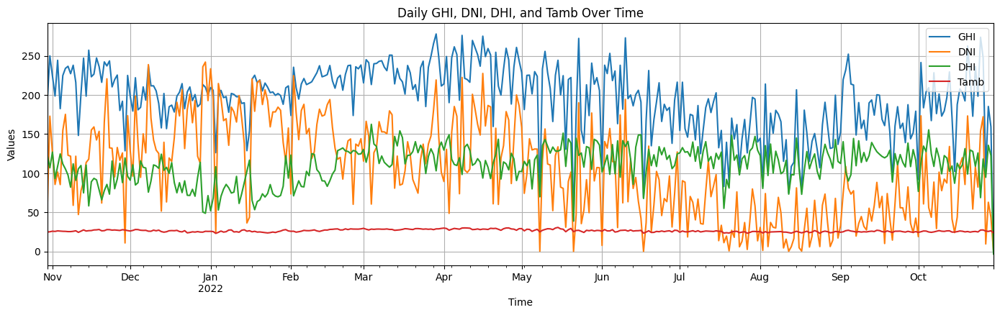

In [14]:
df.set_index('Timestamp', inplace=True)

# Resample the data by day or month to observe patterns (optional: you can resample by hour as well)
df_daily = df.resample('D').mean()
df_monthly = df.resample('M').mean()

# Plotting GHI, DNI, DHI, and Tamb over time (using daily resampled data)
plt.figure(figsize=(14, 8))

# Line plot for GHI, DNI, DHI, and Tamb
plt.subplot(2, 1, 1)
df_daily[['GHI', 'DNI', 'DHI', 'Tamb']].plot(ax=plt.gca(), linewidth=1.5)
plt.title('Daily GHI, DNI, DHI, and Tamb Over Time')
plt.ylabel('Values')
plt.xlabel('Time')
plt.grid(True)

plt.tight_layout()
plt.show()

 Correlational analysis

Correlation Matrix:
                     GHI       DNI       DHI      ModA      ModB      Tamb  \
GHI            1.000000  0.794489  0.834099  0.978198  0.977433  0.643527   
DNI            0.794489  1.000000  0.547597  0.804319  0.800893  0.570306   
DHI            0.834099  0.547597  1.000000  0.824458  0.822789  0.576118   
ModA           0.978198  0.804319  0.824458  1.000000  0.993020  0.638533   
ModB           0.977433  0.800893  0.822789  0.993020  1.000000  0.635259   
Tamb           0.643527  0.570306  0.576118  0.638533  0.635259  1.000000   
RH            -0.530000 -0.529426 -0.435670 -0.541558 -0.537106 -0.752567   
WS             0.395245  0.329386  0.373335  0.390757  0.388738  0.561239   
WSgust         0.439626  0.361548  0.415512  0.435423  0.433249  0.584838   
WSstdev        0.421664  0.338900  0.400561  0.420248  0.418339  0.495150   
Cleaning            NaN       NaN       NaN       NaN       NaN       NaN   
WD             0.400058  0.298467  0.401555  0.391671  

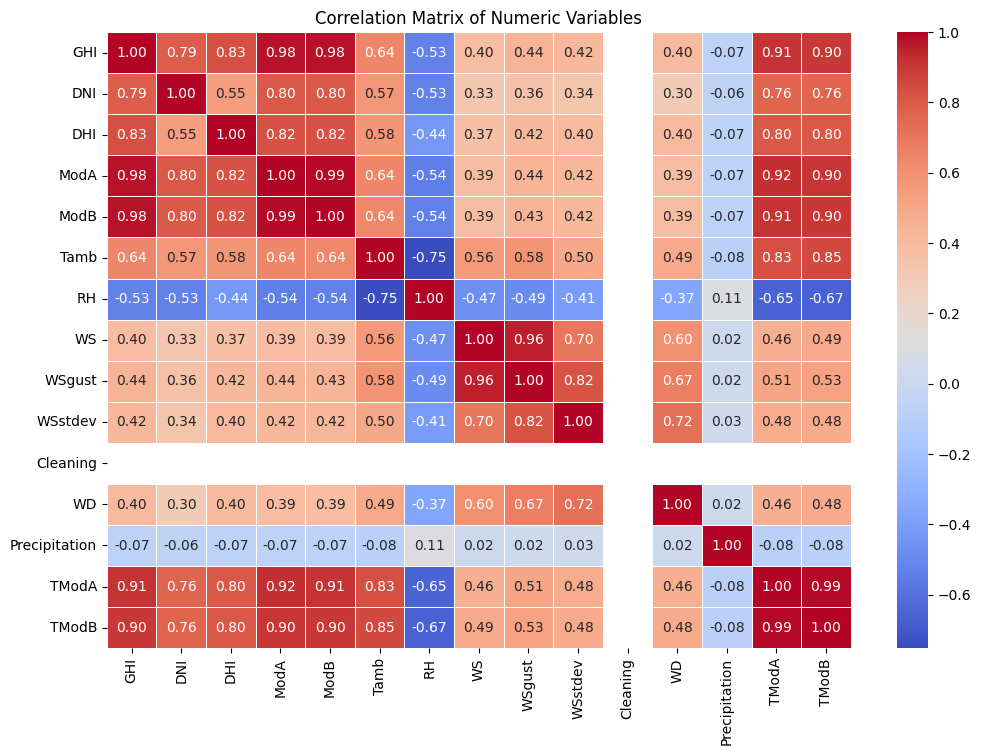

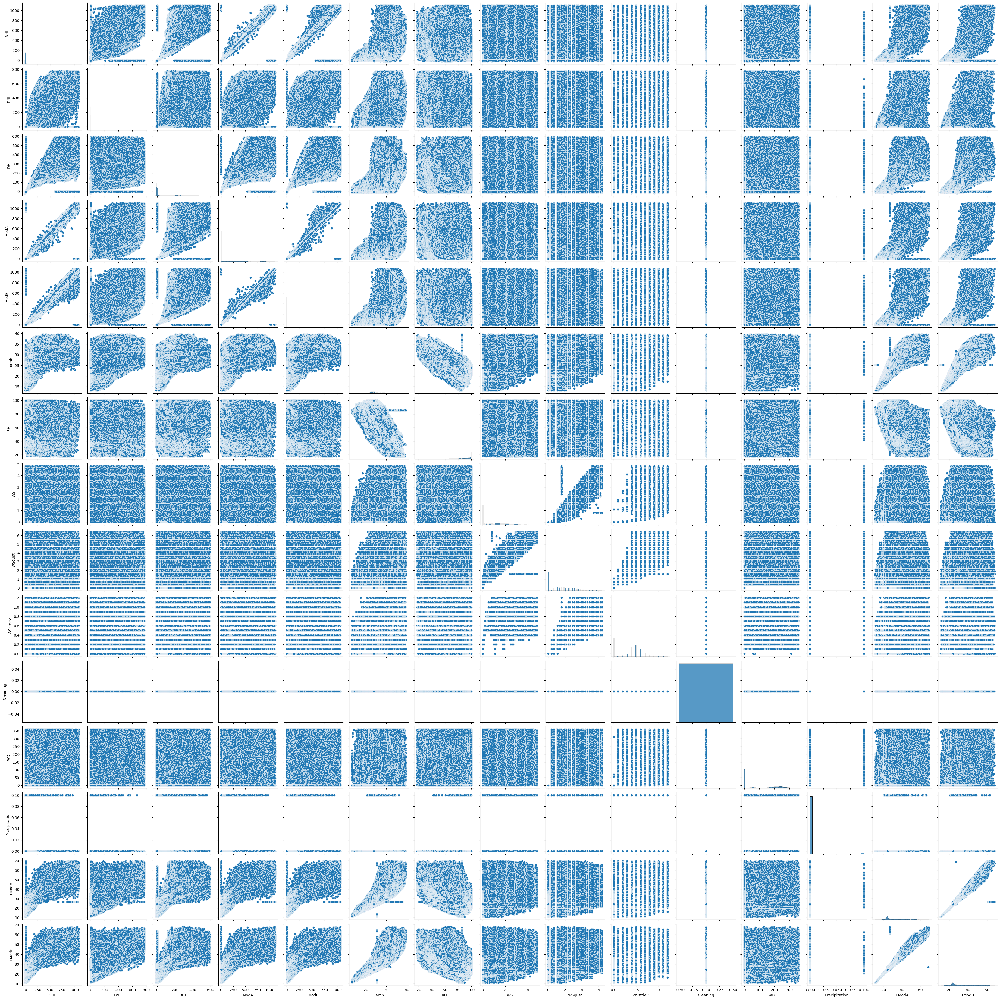

In [15]:
# Calculate the correlation matrix for the numeric columns
correlation_matrix = benin_df_numeric.corr()

# Print the correlation matrix
print("Correlation Matrix:\n", correlation_matrix)

# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Numeric Variables')
plt.show()

# Optional: Pairplot for further investigation of correlations
sns.pairplot(benin_df_numeric)
plt.show()

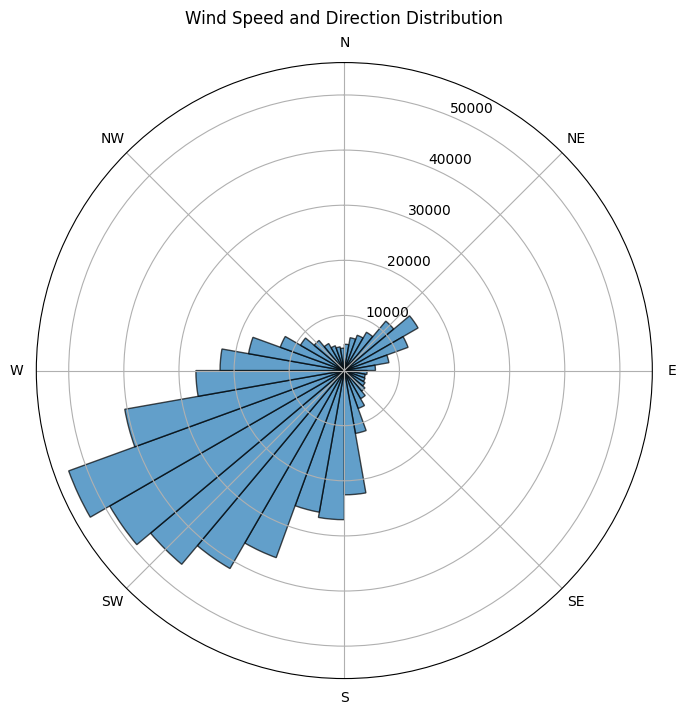

In [16]:

# Prepare the data
wind_speed = df['WS']   # Wind Speed
wind_direction = df['WD']  # Wind Direction in degrees

# Ensure no NaN values in the data for plotting
wind_speed = wind_speed.dropna()
wind_direction = wind_direction.dropna()

# Convert wind direction to radians for polar plotting
wind_direction_rad = np.deg2rad(wind_direction)

# Create a wind rose (polar plot)
plt.figure(figsize=(10, 8))
ax = plt.subplot(111, polar=True)

# Create a histogram for wind direction and speed
# Binning wind directions into 36 bins (10 degrees each)
num_bins = 36
bins = np.linspace(0, 2 * np.pi, num_bins + 1)
wind_speed_bins = ax.hist(wind_direction_rad, bins=bins, weights=wind_speed, alpha=0.7, edgecolor='k')

# Set labels and titles
ax.set_theta_direction(-1)  # Reverse direction to match meteorological conventions
ax.set_theta_offset(np.pi / 2.0)  # Rotate to set 0 degrees to north
ax.set_title("Wind Speed and Direction Distribution", va='bottom')
ax.set_xticks(np.linspace(0, 2 * np.pi, 8, endpoint=False))  # Set cardinal directions
ax.set_xticklabels(['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'])

# Display the polar plot
plt.show()


c:\Users\Ghost\Desktop\TenxWeek0\.venev\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


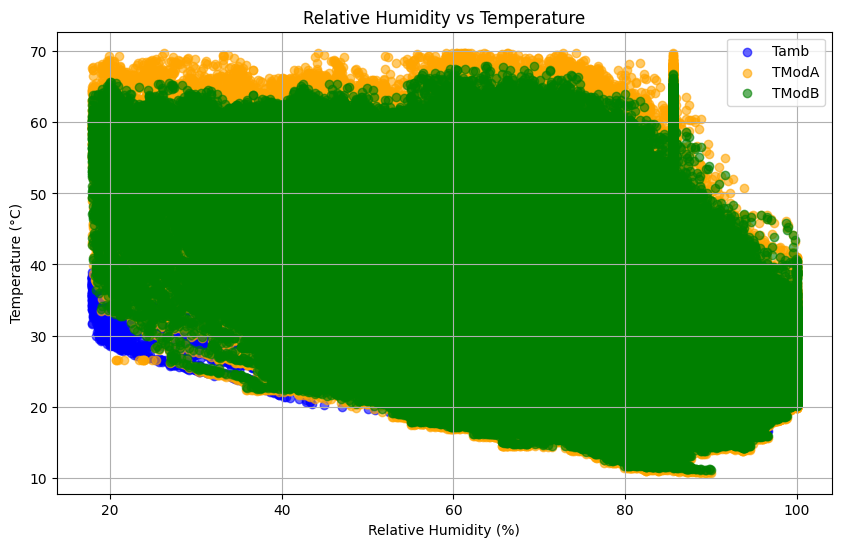

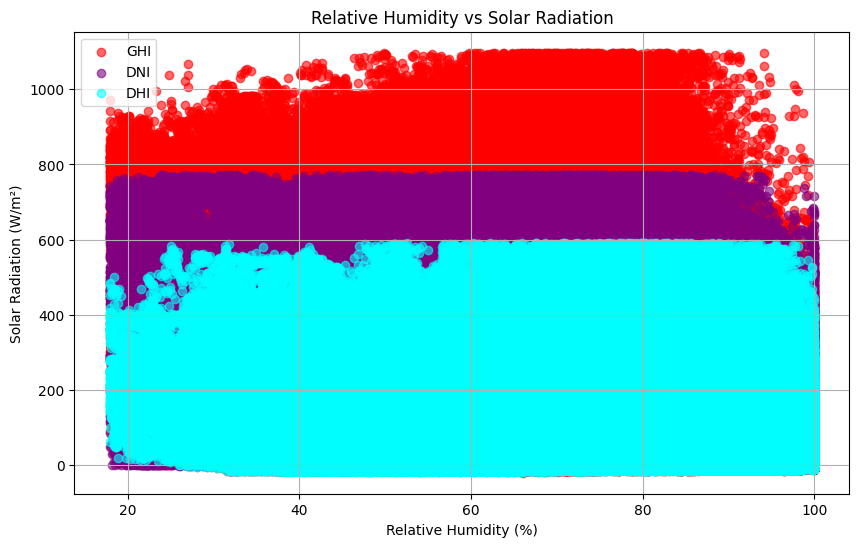

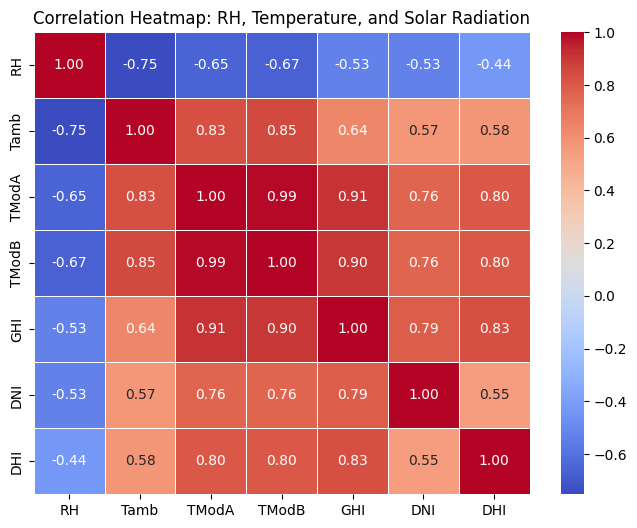

In [17]:

# Scatter Plot: RH vs. Temperature
plt.figure(figsize=(10, 6))
plt.scatter(df['RH'], df['Tamb'], alpha=0.6, color='blue', label='Tamb')
plt.scatter(df['RH'], df['TModA'], alpha=0.6, color='orange', label='TModA')
plt.scatter(df['RH'], df['TModB'], alpha=0.6, color='green', label='TModB')
plt.title("Relative Humidity vs Temperature")
plt.xlabel("Relative Humidity (%)")
plt.ylabel("Temperature (°C)")
plt.legend()
plt.grid(True)
plt.show()

# Scatter Plot: RH vs Solar Radiation (GHI, DNI, DHI)
plt.figure(figsize=(10, 6))
plt.scatter(df['RH'], df['GHI'], alpha=0.6, color='red', label='GHI')
plt.scatter(df['RH'], df['DNI'], alpha=0.6, color='purple', label='DNI')
plt.scatter(df['RH'], df['DHI'], alpha=0.6, color='cyan', label='DHI')
plt.title("Relative Humidity vs Solar Radiation")
plt.xlabel("Relative Humidity (%)")
plt.ylabel("Solar Radiation (W/m²)")
plt.legend()
plt.grid(True)
plt.show()

# Heatmap: Correlation Analysis
# Calculate correlation matrix for selected columns
correlation_matrix = df[['RH', 'Tamb', 'TModA', 'TModB', 'GHI', 'DNI', 'DHI']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap: RH, Temperature, and Solar Radiation")
plt.show()


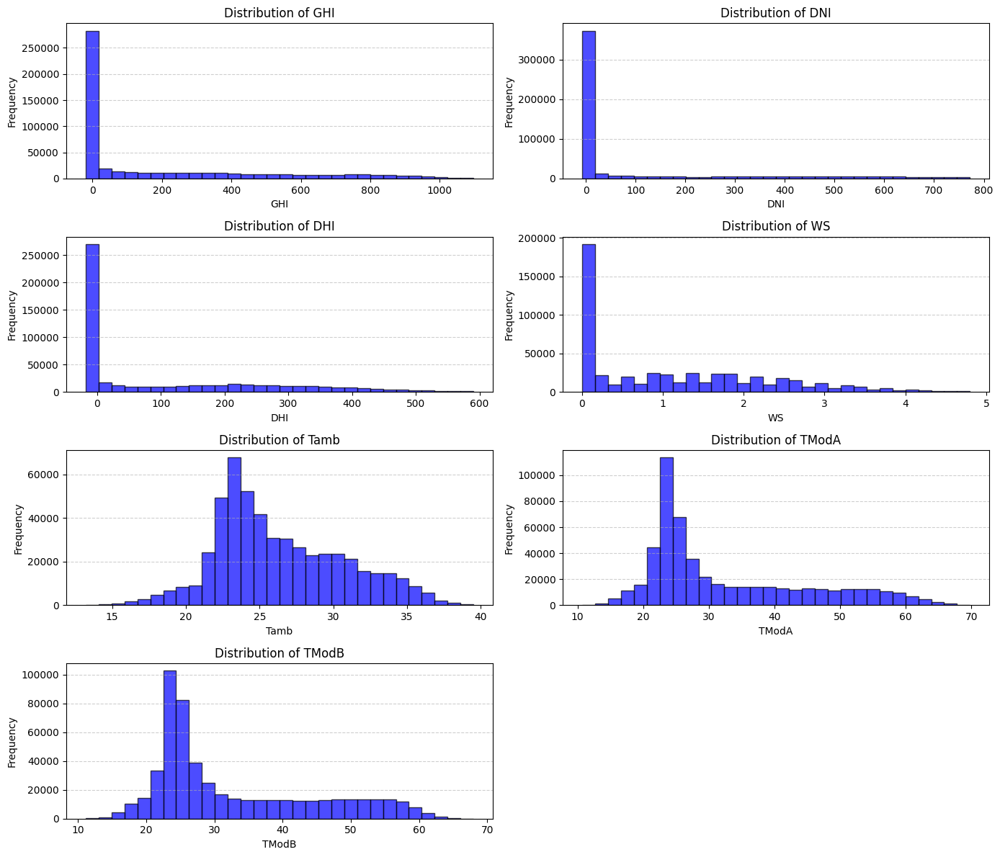

In [18]:

# Define columns to plot
columns_to_plot = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'TModA', 'TModB']

# Create a figure for histograms
plt.figure(figsize=(14, 12))

# Loop through each column and plot a histogram
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(4, 2, i)  # Create a subplot grid (4 rows, 2 columns)
    plt.hist(df[column], bins=30, color='blue', alpha=0.7, edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(axis='y', linestyle='--', alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


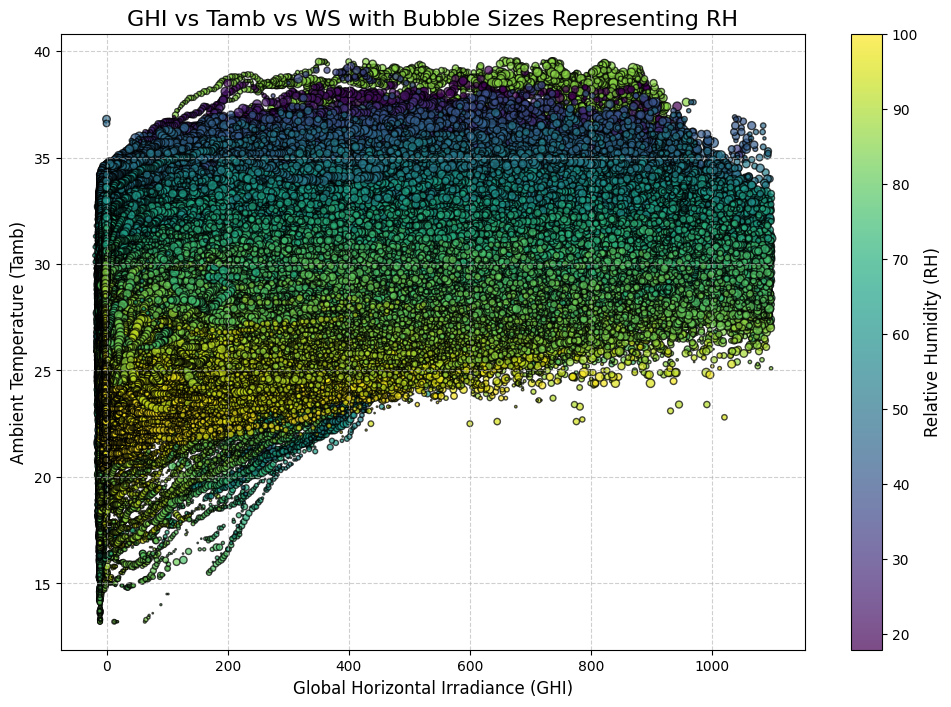

In [19]:

# Define the variables to plot
x = df['GHI']     # X-axis: Global Horizontal Irradiance
y = df['Tamb']    # Y-axis: Ambient Temperature
bubble_size = df['WS']  # Bubble size: Wind Speed
color = df['RH']  # Bubble color: Relative Humidity (RH)

# Plot the bubble chart
plt.figure(figsize=(12, 8))
bubble = plt.scatter(
    x, y, 
    s=bubble_size * 10,  # Scale bubble size for better visibility
    c=color,             # Use RH or BP for color mapping
    cmap='viridis',      # Color map for RH
    alpha=0.7,           # Transparency
    edgecolor='black'    # Bubble edges
)

# Add color bar for reference
color_bar = plt.colorbar(bubble)
color_bar.set_label('Relative Humidity (RH)', fontsize=12)

# Add labels and title
plt.title('GHI vs Tamb vs WS with Bubble Sizes Representing RH', fontsize=16)
plt.xlabel('Global Horizontal Irradiance (GHI)', fontsize=12)
plt.ylabel('Ambient Temperature (Tamb)', fontsize=12)

# Add grid
plt.grid(True, linestyle='--', alpha=0.6)

# Display the plot
plt.show()
